#  Самостоятельный проект: Сборный проект —2.
# Задача 1: предсказание уровня удовлетворённости сотрудника

## Описание проекта
Позади много уроков и заданий, и закрепить свои знания, как обычно, вы сможете в самостоятельном проекте. Это непростой проект, в котором от вас потребуется больше самостоятельности. Этапы работы описаны кратко, и вам понадобится декомпозировать задачи, то есть разделить их на более мелкие. Опирайтесь на знания об этапах анализа данных и машинного обучения из прошлых курсов.
Перейдём к задаче. HR-аналитики компании «Работа с заботой» помогают бизнесу оптимизировать управление персоналом: бизнес предоставляет данные, а аналитики предлагают, как избежать финансовых потерь и оттока сотрудников. В этом HR-аналитикам пригодится машинное обучение, с помощью которого получится быстрее и точнее отвечать на вопросы бизнеса.
Компания предоставила данные с характеристиками сотрудников компании. Среди них — уровень удовлетворённости сотрудника работой в компании. Эту информацию получили из форм обратной связи: сотрудники заполняют тест-опросник, и по его результатам рассчитывается доля их удовлетворённости от 0 до 1, где 0 — совершенно неудовлетворён, 1 — полностью удовлетворён.
Собирать данные такими опросниками не так легко: компания большая, и всех сотрудников надо сначала оповестить об опросе, а затем проследить, что все его прошли.
У вас будет несколько задач. Первая — построить модель, которая сможет предсказать уровень удовлетворённости сотрудника на основе данных заказчика.
Почему бизнесу это важно: удовлетворённость работой напрямую влияет на отток сотрудников. А предсказание оттока — одна из важнейших задач HR-аналитиков. Внезапные увольнения несут в себе риски для компании, особенно если уходит важный сотрудник.
Ваша вторая задача — построить модель, которая сможет на основе данных заказчика предсказать то, что сотрудник уволится из компании.
Теперь расскажем подробнее о задачах.
Задача 1: предсказание уровня удовлетворённости сотрудника
Для этой задачи заказчик предоставил данные с признаками:
id — уникальный идентификатор сотрудника;
dept — отдел, в котором работает сотрудник;
level — уровень занимаемой должности;
workload — уровень загруженности сотрудника;
employment_years — длительность работы в компании (в годах);
last_year_promo — показывает, было ли повышение за последний год;
last_year_violations — показывает, нарушал ли сотрудник трудовой договор за последний год;
supervisor_evaluation — оценка качества работы сотрудника, которую дал руководитель;
salary — ежемесячная зарплата сотрудника;
job_satisfaction_rate — уровень удовлетворённости сотрудника работой в компании, целевой признак.

## Загрузка данных

In [1]:
#Устанавливаем нужные библиотеки, что бы импортировать функции
!pip install yellowbrick
!pip install phik
!pip install shap
!pip install optuna
!pip install mlxtend
!pip install imbalanced-learn

In [2]:
#Испортипуем библиотеки
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
from scipy.stats import spearmanr
import shap,sklearn,phik,optuna,imblearn
from sklearn.model_selection import train_test_split,KFold,cross_val_score,GridSearchCV,RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler,OneHotEncoder, OrdinalEncoder
from sklearn.metrics import make_scorer, roc_curve, roc_auc_score
from sklearn import svm
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression,  LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.dummy import DummyClassifier
from sklearn.datasets import make_classification
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from phik.report import plot_correlation_matrix
from imblearn.over_sampling import RandomOverSampler
from mlxtend.plotting import plot_decision_regions
from itertools import combinations
from sklearn.dummy import DummyRegressor
plt.rcParams["figure.figsize"] = (8,4)

In [3]:
#загружаем данные
df_train_job = pd.read_csv('https://code.s3.yandex.net/datasets/train_job_satisfaction_rate.csv',index_col=0)
df_train_job.sample(10)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate
id,,,,,,,,,
790026,marketing,junior,medium,1,no,no,5,32400,0.64
651867,marketing,junior,low,2,no,no,1,16800,0.48
288874,sales,middle,low,4,no,no,4,19200,0.52
184712,hr,junior,medium,1,no,no,3,26400,0.34
478080,purchasing,junior,medium,3,no,no,4,22800,0.63
938983,marketing,middle,high,3,no,no,4,52800,0.57
620902,hr,middle,medium,6,no,no,3,43200,0.74
405448,hr,middle,low,7,no,no,4,30000,0.78
836094,technology,middle,low,7,no,no,2,21600,0.33


In [4]:
df_train_job.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4000 entries, 155278 to 338347
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   dept                   3994 non-null   object 
 1   level                  3996 non-null   object 
 2   workload               4000 non-null   object 
 3   employment_years       4000 non-null   int64  
 4   last_year_promo        4000 non-null   object 
 5   last_year_violations   4000 non-null   object 
 6   supervisor_evaluation  4000 non-null   int64  
 7   salary                 4000 non-null   int64  
 8   job_satisfaction_rate  4000 non-null   float64
dtypes: float64(1), int64(3), object(5)
memory usage: 312.5+ KB


In [5]:
#загружаем данные
df_test_features = pd.read_csv("https://code.s3.yandex.net/datasets/test_features.csv",index_col=0)
df_test_features.sample(10)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
id,,,,,,,,
290489,hr,middle,high,4,no,no,3,57600
916101,hr,junior,low,1,no,no,4,20400
976024,sales,middle,low,2,yes,no,2,27600
717671,marketing,junior,high,1,no,no,4,39600
952435,purchasing,middle,medium,9,no,yes,3,44400
500791,sales,middle,high,9,no,no,4,49200
482515,marketing,middle,low,8,no,no,4,25200
497906,technology,middle,medium,2,no,no,4,39600
793139,hr,middle,medium,6,no,no,5,40800


In [6]:
df_test_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 485046 to 771859
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   dept                   1998 non-null   object
 1   level                  1999 non-null   object
 2   workload               2000 non-null   object
 3   employment_years       2000 non-null   int64 
 4   last_year_promo        2000 non-null   object
 5   last_year_violations   2000 non-null   object
 6   supervisor_evaluation  2000 non-null   int64 
 7   salary                 2000 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 140.6+ KB


In [7]:
#загружаем данные
df_test_target = pd.read_csv("https://code.s3.yandex.net/datasets/test_target_job_satisfaction_rate.csv",index_col=0)
df_test_target.sample(10)

,job_satisfaction_rate
id,
826870,0.37
544149,0.13
832002,0.24
264504,0.55
765110,0.68
513488,0.68
767764,0.68
160233,0.43
753322,0.73


In [8]:
df_test_target.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 130604 to 648995
Data columns (total 1 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   job_satisfaction_rate  2000 non-null   float64
dtypes: float64(1)
memory usage: 31.2 KB


## Предобработка данных

In [9]:
#Проверяем пропуски
df_train_job.isna().sum()

dept                     6
level                    4
workload                 0
employment_years         0
last_year_promo          0
last_year_violations     0
supervisor_evaluation    0
salary                   0
job_satisfaction_rate    0
dtype: int64

In [10]:
#Проверяем пропуски
df_test_features.isna().sum()

dept                     2
level                    1
workload                 0
employment_years         0
last_year_promo          0
last_year_violations     0
supervisor_evaluation    0
salary                   0
dtype: int64

In [11]:
#Проверяем пропуски
df_test_target.isna().sum()

job_satisfaction_rate    0
dtype: int64

In [12]:
#Выводим дубликаты в датафреймах
df_train_job.duplicated().sum()

245

In [13]:
#Удаляем дубликат и проверяем количество строк после
df_train_job.drop_duplicates(inplace=True)

In [14]:
print(df_train_job.duplicated().sum())
print(df_train_job.shape)

0
(3755, 9)


In [15]:
df_train_job.index.value_counts()

296961    1
624086    1
408237    1
835009    1
347587    1
         ..
862888    1
548638    1
561835    1
295597    1
428031    1
Name: id, Length: 3755, dtype: int64

In [16]:
#Выводим дубликаты в датафреймах
df_test_features.duplicated().sum()

557

In [17]:
df_test_features.index.value_counts()

727043    1
340625    1
996005    1
356579    1
791203    1
         ..
683546    1
867647    1
314685    1
527675    1
200700    1
Name: id, Length: 2000, dtype: int64

In [18]:
#Выводим дубликаты в датафреймах
df_test_target.duplicated().sum()

1902

In [19]:
df_test_target.index.value_counts()

727043    1
791203    1
836287    1
281278    1
404154    1
         ..
875851    1
230381    1
757063    1
628038    1
200700    1
Name: id, Length: 2000, dtype: int64

In [20]:
#Выводим на экран все уникальные значения
df_train_job['level'].unique()

array(['junior', 'middle', 'sinior', nan], dtype=object)

In [21]:
#Проверяем количество уникальных значений
df_train_job['level'].value_counts()

junior    1699
middle    1695
sinior     357
Name: level, dtype: int64

In [22]:
#Выводим на экран все уникальные значения
df_train_job['dept'].unique()

array(['sales', 'hr', 'technology', 'purchasing', 'marketing', nan],
      dtype=object)

In [23]:
#Заменим пропуски в столбце dept
df_train_job.loc[df_train_job['dept'] == ' ','dept'] = np.nan

In [24]:
#Проверяем количество уникальных значений
df_train_job['dept'].value_counts()

sales         1374
technology     818
purchasing     586
marketing      531
hr             440
Name: dept, dtype: int64

In [25]:
#Выводим на экран все уникальные значения
df_train_job['workload'].unique()

array(['medium', 'high', 'low'], dtype=object)

In [26]:
#Проверяем количество уникальных значений
df_train_job['workload'].value_counts()

medium    1908
low       1125
high       722
Name: workload, dtype: int64

In [27]:
#Выводим на экран все уникальные значения
df_train_job['last_year_promo'].unique()

array(['no', 'yes'], dtype=object)

In [28]:
#Проверяем количество уникальных значений
df_train_job['last_year_promo'].value_counts()

no     3635
yes     120
Name: last_year_promo, dtype: int64

In [29]:
#Выводим на экран все уникальные значения
df_train_job['last_year_violations'].unique()

array(['no', 'yes'], dtype=object)

In [30]:
#Проверяем количество уникальных значений
df_train_job['last_year_violations'].value_counts()

no     3202
yes     553
Name: last_year_violations, dtype: int64

In [31]:
#Поменяем название в столбцн level
df_train_job['level'] = df_train_job['level'].str.replace('sinior','senior',  regex=True)

In [32]:
df_train_job['level'].unique()

array(['junior', 'middle', 'senior', nan], dtype=object)

In [33]:
df_train_job.shape,df_test_features.shape,df_test_target.shape

((3755, 9), (2000, 8), (2000, 1))

## Вывод

Есть пропуски в двух выборках - тренировочная выборка и входные признаки тестовой выборки. В столбцах отдел сотрудника и уровень занимаемой должности.

Были дубликаты и в трен., и в тест. признаках. Удалила дупликаты из тренировочной выборки.

Данные типа float,int,object.

##  Исследовательский анализ данных

In [34]:
df_train_job.describe()

,employment_years,supervisor_evaluation,salary,job_satisfaction_rate
count,3755.000000,3755.000000,3755.000000,3755.000000
mean,3.817044,3.463648,34457.416778,0.532554
std,2.557142,1.026265,15050.643870,0.226393
min,1.000000,1.000000,12000.000000,0.030000
25%,2.000000,3.000000,22800.000000,0.350000
50%,3.000000,4.000000,31200.000000,0.550000
75%,6.000000,4.000000,44400.000000,0.710000
max,10.000000,5.000000,98400.000000,1.000000


In [35]:
#Получаем яшик с усами для целевого признака
fig = px.box(df_train_job, x="job_satisfaction_rate",title="job_satisfaction_rate",width=600, height=400)
fig.update_layout(title='Уровень удовлетворённости сотрудника')
fig.show()

In [36]:
#Получаем гистограмму для целевого признака
fig = px.histogram(df_train_job, x="job_satisfaction_rate",title='Уровень удовлетворённости сотрудника',
                   nbins=20,width=600, height=400)
fig.update_xaxes(title_text='Уровень удовлетворённости сотрудника',title_font=dict(size=14))
fig.update_yaxes(title_text='Count')
fig.show()

In [37]:
#Получаем гистограмму для входным признакам
fig = px.histogram(df_train_job, x="employment_years",title='Длительность работы в компании (в годах)',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Длительность работы в компании (в годах)',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_train_job, x="salary",title='Ежемесячная зарплата сотрудника',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Ежемесячная зарплата сотрудника',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_train_job, x="supervisor_evaluation",title='Оценка качества работы сотрудника', nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Оценка качества работы сотрудника',title_font=dict(size=14))
fig.show()

По годам большинство сотрудников работают от 1 до 2 года..В основном у большинства з/п от 25 до 30к. У большинства оценка качества работы 3 и 4.

In [38]:
#Получаем график ящик с усами
fig = px.box(df_train_job, x="employment_years",title="Уровень удовлетворённости сотрудника",width=600, height=400)
fig.show()
fig = px.box(df_train_job,x="salary",title="Ежемесячная зарплата сотрудника",width=600, height=400)
fig.update_layout(title='Ежемесячная зарплата сотрудника')
fig.show()
fig = px.box(df_train_job, x="supervisor_evaluation",title="Оценка качества работы сотрудника",width=600, height=400)
fig.update_layout(title='Оценка качества работы сотрудника')
fig.show()

Выброс есть  в признаках оценка качества работы и зарплаты.

In [39]:
cat_col =df_train_job[['dept','level','workload','last_year_promo','last_year_violations','job_satisfaction_rate']].copy()

In [40]:
#Получаем графики по данным
fig = px.bar(df_train_job, x="dept",title="Отдел сотрудника",width=450, height=400)
fig.update_xaxes(title_text='Отдел сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color = 'green',textfont_size=12)
fig.show()
fig = px.bar(df_train_job, x="level",title='Уровень занимаемой должности',width=450, height=400)
fig.update_xaxes(title_text='Уровень занимаемой должности',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_train_job, x="workload",title='Уровень загруженности сотрудника',width=450, height=400)
fig.update_xaxes(title_text='Уровень загруженности сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_train_job, x="last_year_promo",title='Повышение за последний год',width=450, height=400)
fig.update_xaxes(title_text='Повышение за последний год',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_train_job, x="last_year_violations",title='Нарушеие сотрудника',width=450, height=400)
fig.update_xaxes(title_text='Нарушеие сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()

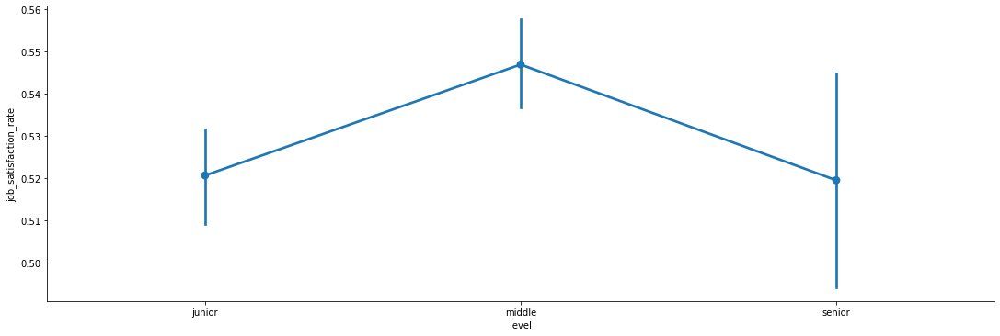

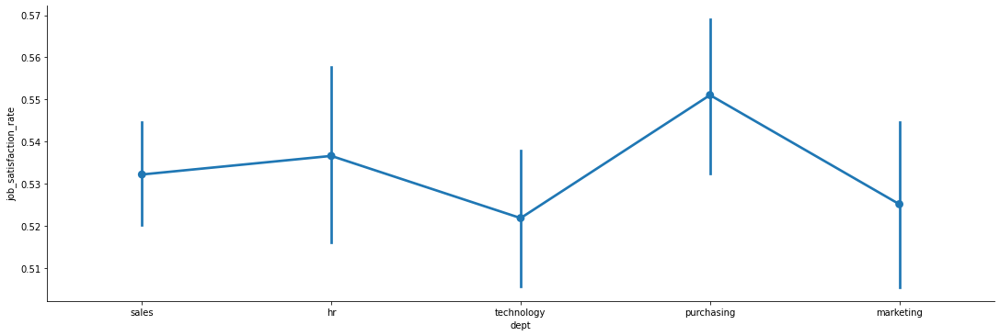

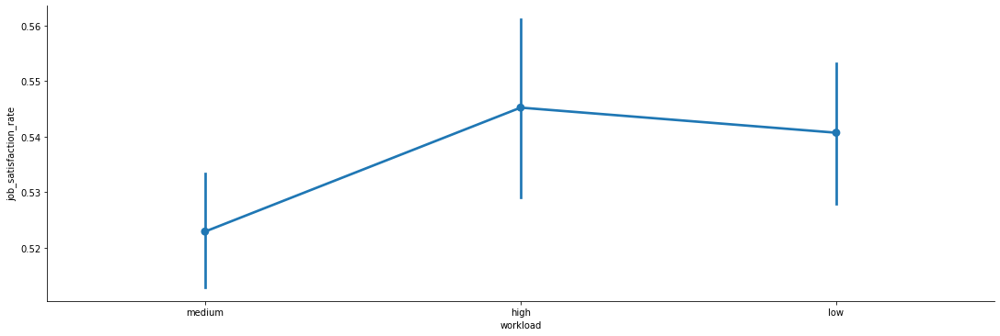

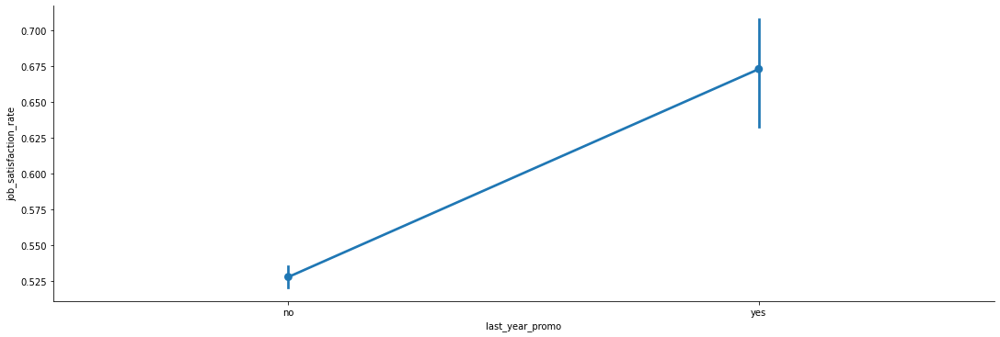

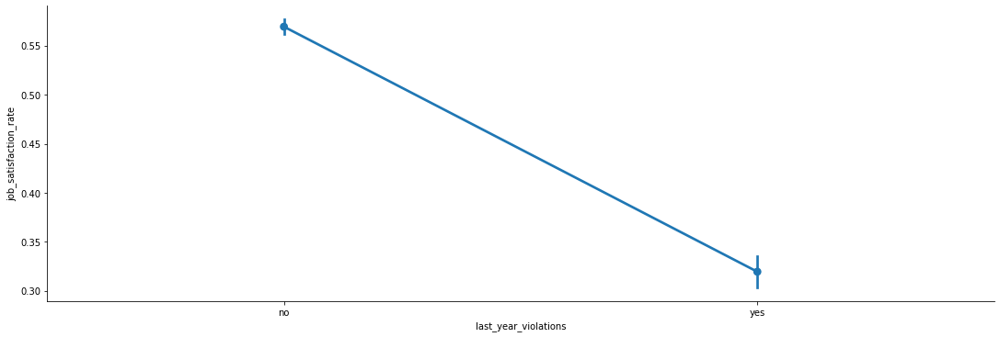

In [41]:
#Получаем график по категориальным признакам
for i,col in enumerate(['level','dept','workload','last_year_promo','last_year_violations']):
    #plt.Figure(i)
    sns.catplot(y='job_satisfaction_rate', x=col, data=cat_col, kind='point', aspect=3);

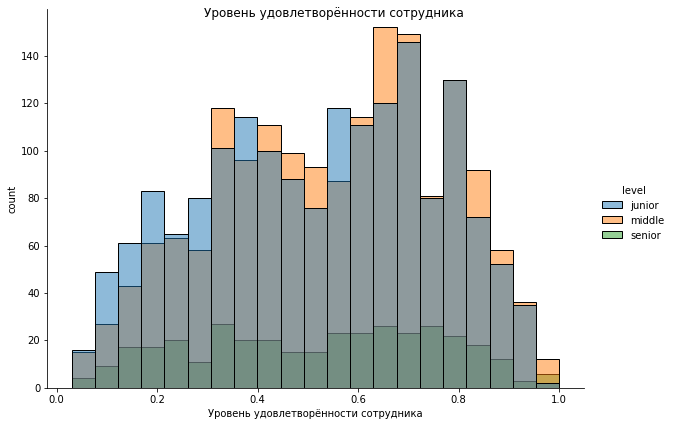

In [42]:
#Получаем график общего распределение
plot = sns.displot(
  data=df_train_job,
  x="job_satisfaction_rate",
  hue="level",
  kind="hist",
  height=6,
  aspect=1.4,
)
plot.set_axis_labels("Уровень удовлетворённости сотрудника", "count")
plot.fig.suptitle("Уровень удовлетворённости сотрудника",
                  fontsize=12, fontdict={"weight": "bold"});

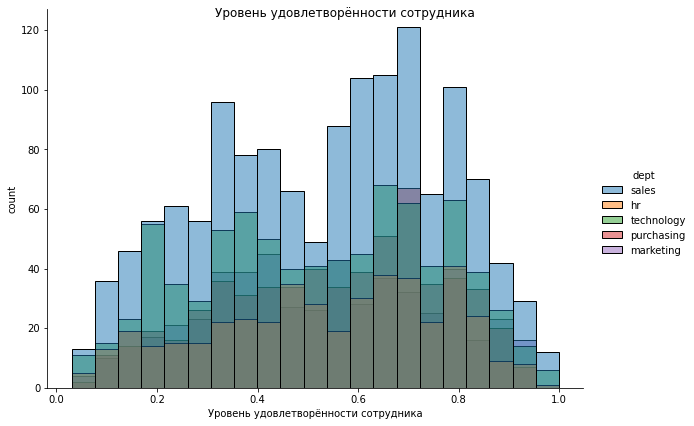

In [43]:
#Получаем график общего распределение
plot = sns.displot(
  data=df_train_job,
  x="job_satisfaction_rate",
  hue="dept",
  kind="hist",
  height=6,
  aspect=1.4,
)
plot.set_axis_labels("Уровень удовлетворённости сотрудника", "count")
plot.fig.suptitle("Уровень удовлетворённости сотрудника",
                  fontsize=12, fontdict={"weight": "bold"});

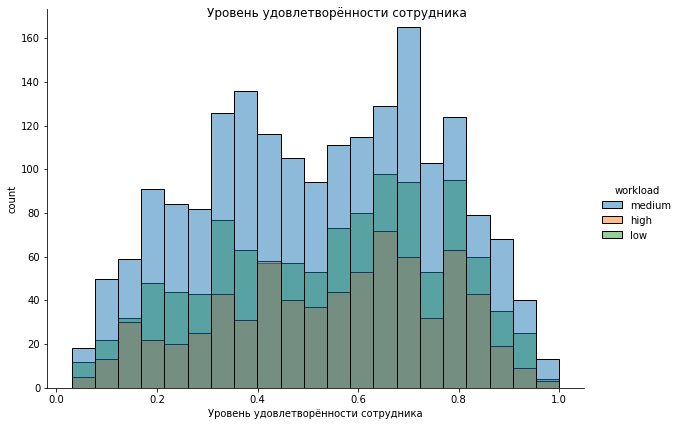

In [44]:
#Получаем график общего распределение
plot = sns.displot(
  data=df_train_job,
  x="job_satisfaction_rate",
  hue="workload",
  kind="hist",
  height=6,
  aspect=1.4,
)
plot.set_axis_labels("Уровень удовлетворённости сотрудника", "count")
plot.fig.suptitle("Уровень удовлетворённости сотрудника",
                  fontsize=12, fontdict={"weight": "bold"});

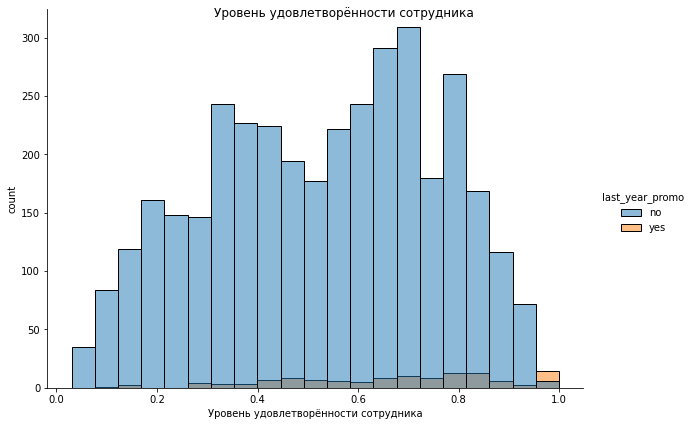

In [45]:
#Получаем график общего распределение
plot = sns.displot(
  data=df_train_job,
  x="job_satisfaction_rate",
  hue="last_year_promo",
  kind="hist",
  height=6,
  aspect=1.4,
)
plot.set_axis_labels("Уровень удовлетворённости сотрудника", "count")
plot.fig.suptitle("Уровень удовлетворённости сотрудника",
                  fontsize=12, fontdict={"weight": "bold"});

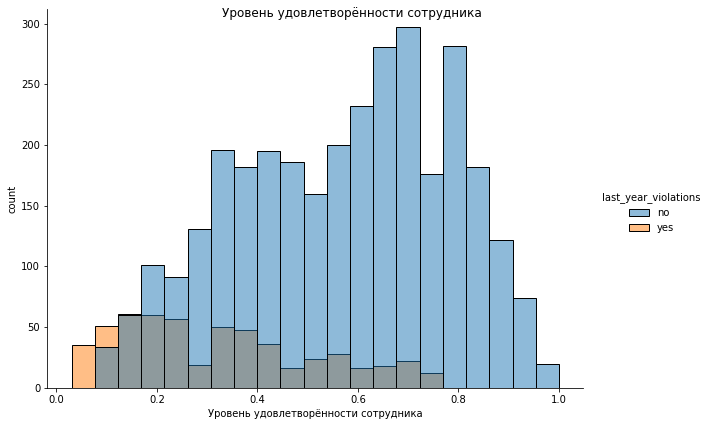

In [46]:
#Получаем график общего распределение
plot = sns.displot(
  data=df_train_job,
  x="job_satisfaction_rate",
  hue="last_year_violations",
  kind="hist",
  height=6,
  aspect=1.4,
)
plot.set_axis_labels("Уровень удовлетворённости сотрудника", "count")
plot.fig.suptitle("Уровень удовлетворённости сотрудника",
                  fontsize=12, fontdict={"weight": "bold"});

In [47]:
#Получаем гистограмму для входным признакам тестовой выборки
fig = px.histogram(df_test_features, x="employment_years",title='Длительность работы в компании (в годах)',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Длительность работы в компании (в годах)',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_test_features, x="salary",title='Ежемесячная зарплата сотрудника',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Ежемесячная зарплата сотрудника',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_test_features, x="supervisor_evaluation",title='Оценка качества работы сотрудника', nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Оценка качества работы сотрудника',title_font=dict(size=14))
fig.show()

In [48]:
#Получаем график ящик с усами
fig = px.box(df_test_features, x="employment_years",title="Уровень удовлетворённости сотрудника",width=600, height=400)
fig.show()
fig = px.box(df_test_features,x="salary",title="Ежемесячная зарплата сотрудника",width=600, height=400)
fig.update_layout(title='Ежемесячная зарплата сотрудника')
fig.show()
fig = px.box(df_test_features, x="supervisor_evaluation",title="Оценка качества работы сотрудника",width=600, height=400)
fig.update_layout(title='Оценка качества работы сотрудника')
fig.show()

In [49]:
#Получаем графики по данным
fig = px.bar(df_test_features, x="dept",title="Отдел сотрудника",width=450, height=400)
fig.update_xaxes(title_text='Отдел сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color = 'green',textfont_size=12)
fig.show()
fig = px.bar(df_test_features, x="level",title='Уровень занимаемой должности',width=450, height=400)
fig.update_xaxes(title_text='Уровень занимаемой должности',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_test_features, x="workload",title='Уровень загруженности сотрудника',width=450, height=400)
fig.update_xaxes(title_text='Уровень загруженности сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_test_features, x="last_year_promo",title='Повышение за последний год',width=450, height=400)
fig.update_xaxes(title_text='Повышение за последний год',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_test_features, x="last_year_violations",title='Нарушеие сотрудника',width=450, height=400)
fig.update_xaxes(title_text='Нарушеие сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()

### Вывод


Большинство сотрудников работают в отделе продаж.Но удовлетворенны в основном в отделе закупок.Уровень должности в основном junior и middle,но удовлетворенны в основном в должности middle. Загруженность в основном средняя,но удовлетворенны в основном со средней и высокой загруженностю.  Повышение за последний год было только один раз, удовлетворенны в основном сотрудники с повышением. Нарушенний тоже было но немного,удовлетворенны в основном сотрудники без нарушении.

На тестовой выборке большинство сотрудников работают от 1 до 2 лет,в отделе продаж,уровнем должности junior,уровнем загруженности medium,без повышении,без нарушении,ежемесячная зарплата 25-29.9к,с оценкой 4.Выбросы есть в признаках зарплата и оценка качества работы.

## Корреляционный анализ

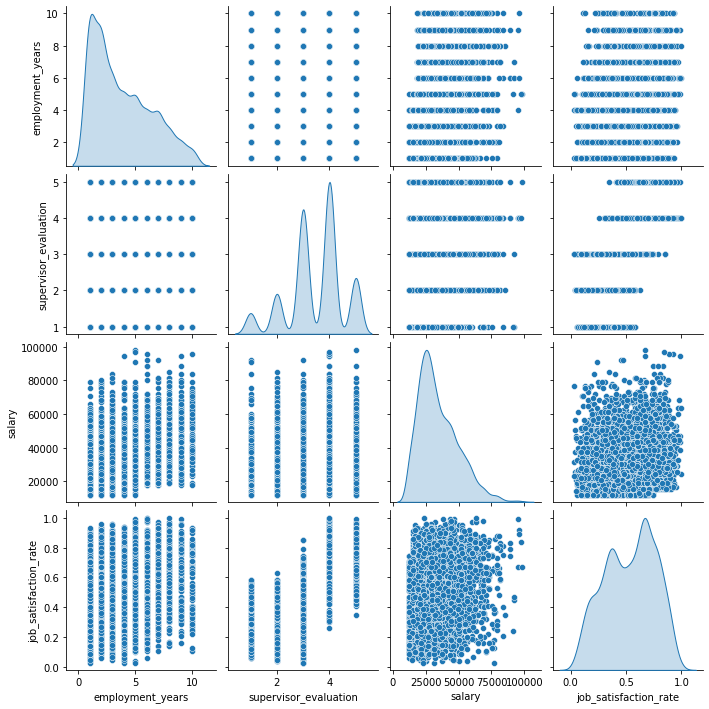

In [50]:
#Получаем кор.график по прзнакам
sns.pairplot(data=df_train_job, kind='scatter',diag_kind='kde');

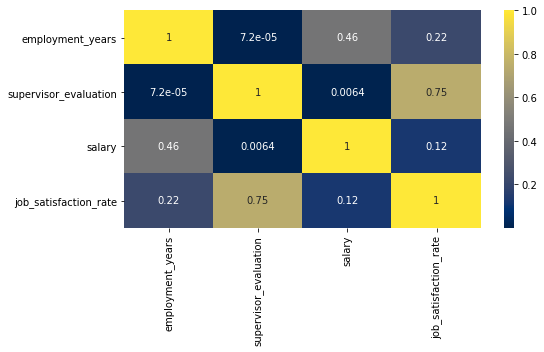

In [51]:
#Получаем кор.график по прзнакам
sns.heatmap(df_train_job.corr(method='spearman'),  annot=True, cmap='cividis');

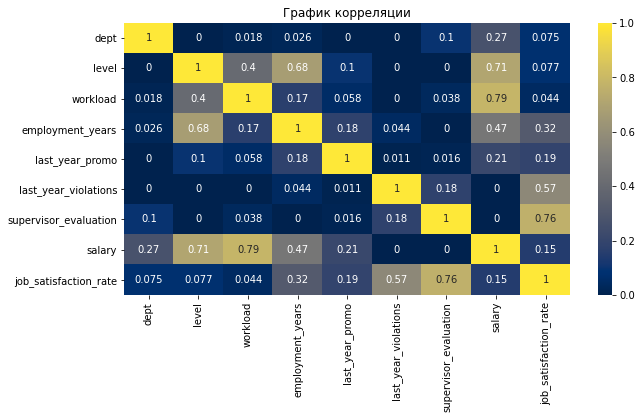

In [52]:
#Получаем кор.график по прзнакам
plt.figure(figsize=(10,5))
sns.heatmap(df_train_job.phik_matrix(interval_cols=['salary'
                                                    ,'job_satisfaction_rate']), annot=True, cmap='cividis')
plt.title('График корреляции');

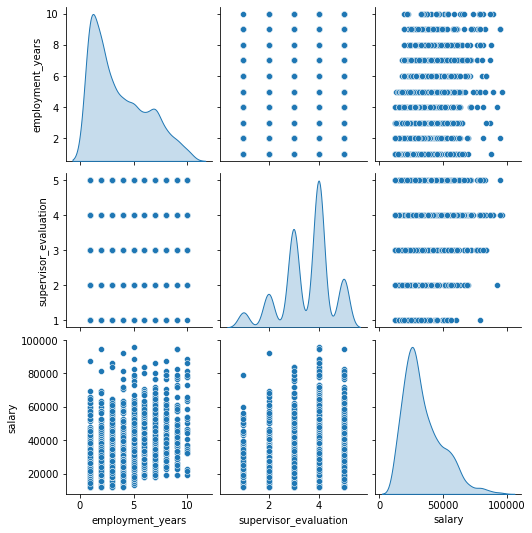

In [53]:
#Получаем кор.график по тестовым прзнакам
sns.pairplot(data=df_test_features, kind='scatter',diag_kind='kde');

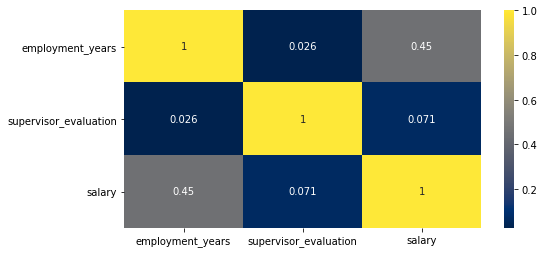

In [54]:
#Получаем кор.график по тестовым прзнакам
sns.heatmap(df_test_features.corr(method='spearman'),  annot=True, cmap='cividis');

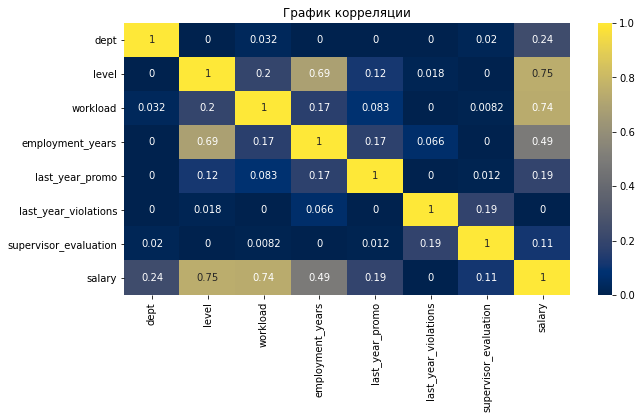

In [55]:
#Получаем кор.график по тестовым прзнакам
plt.figure(figsize=(10,5))
sns.heatmap(df_test_features.phik_matrix(interval_cols=['salary']), annot=True, cmap='cividis')
plt.title('График корреляции');

Есть сильная корр. между оценкой со стороны руководителя и оценкой удовлетворённости,загруженностю,уровнем должностьи и зарплатой . Есть умеренная зависимость между длительность работы в компании и ежемесячная зарплатой,нарушением сотрудника и оценкой удовлетворённости.

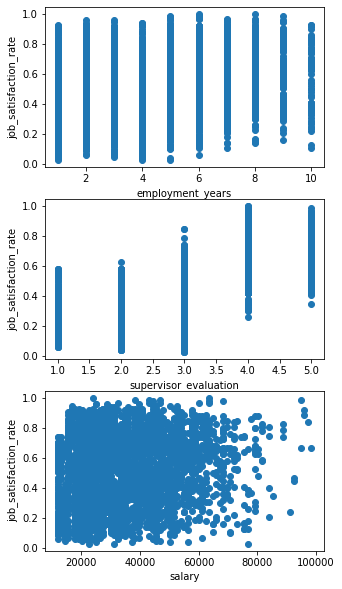

In [56]:
#Получаем кор.график по прзнакам
fig, ax = plt.subplots(3, figsize=(5,10))

ax[0].scatter(x = df_train_job['employment_years'], y = df_train_job['job_satisfaction_rate'])
ax[0].set_xlabel("employment_years")
ax[0].set_ylabel("job_satisfaction_rate")

ax[1].scatter(x = df_train_job['supervisor_evaluation'], y = df_train_job['job_satisfaction_rate'])
ax[1].set_xlabel("supervisor_evaluation")
ax[1].set_ylabel("job_satisfaction_rate")

ax[2].scatter(x = df_train_job['salary'], y = df_train_job['job_satisfaction_rate'])
ax[2].set_xlabel("salary")
ax[2].set_ylabel("job_satisfaction_rate")
plt.show()

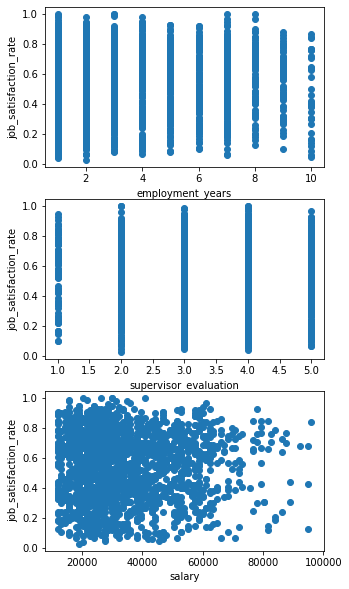

SpearmanrResult(correlation=-0.0017699895792618599, pvalue=0.9369475830672795)
SpearmanrResult(correlation=0.022054747547179815, pvalue=0.3242206793270367)
SpearmanrResult(correlation=0.0033850942079859834, pvalue=0.8797455334274653)


In [57]:
#Получаем кор.график по прзнакам
fig, ax = plt.subplots(3, figsize=(5,10))

ax[0].scatter(x = df_test_features['employment_years'], y = df_test_target['job_satisfaction_rate'])
ax[0].set_xlabel("employment_years")
ax[0].set_ylabel("job_satisfaction_rate")

ax[1].scatter(x = df_test_features['supervisor_evaluation'], y = df_test_target['job_satisfaction_rate'])
ax[1].set_xlabel("supervisor_evaluation")
ax[1].set_ylabel("job_satisfaction_rate")

ax[2].scatter(x = df_test_features['salary'], y = df_test_target['job_satisfaction_rate'])
ax[2].set_xlabel("salary")
ax[2].set_ylabel("job_satisfaction_rate")
plt.show()
print(stats.spearmanr(df_test_features['employment_years'], df_test_target['job_satisfaction_rate']))
print(stats.spearmanr(df_test_features['supervisor_evaluation'], df_test_target['job_satisfaction_rate']))
print(stats.spearmanr(df_test_features['salary'], df_test_target['job_satisfaction_rate']))

### Вывод

По распределению на тренировочной выборке есть умеренная зависимость между  ежемесячная зарплатой, уровень удовлетворённости сотрудника и длительность работы в компании. Заметная зависимость между признаками нарушения сотрудника и уровень удовлетворённости сотрудника. Высокая зависимость между признаками  ежемесячная зарплата и  уровень занимаемой должности,уровень загруженности сотрудника и между признаками уровень удовлетворённости сотрудника и оценка качества работы сотрудника.

На тестовой выборке есть заметная зависимость между признаками длительность работы в компании и уровень занимаемой должности,ежемесячная зарплата сотрудника.Высокая зависимость между признаками ежемесячная зарплата сотрудника уровень занимаемой должности,уровень загруженности сотрудника.

In [58]:
df_feautures_all = df_test_features.join(df_test_target,on='id')

In [59]:
df_feautures_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 485046 to 771859
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   dept                   1998 non-null   object 
 1   level                  1999 non-null   object 
 2   workload               2000 non-null   object 
 3   employment_years       2000 non-null   int64  
 4   last_year_promo        2000 non-null   object 
 5   last_year_violations   2000 non-null   object 
 6   supervisor_evaluation  2000 non-null   int64  
 7   salary                 2000 non-null   int64  
 8   job_satisfaction_rate  2000 non-null   float64
dtypes: float64(1), int64(3), object(5)
memory usage: 156.2+ KB


## Подготовка данных.Пайплайн

In [60]:
#создаём константы RANDOM_STATE и делим даные
RANDOM_STATE = 42
TEST_SIZE = 0.25

In [61]:
#Разбиваем выборку
X_train =  df_train_job.drop(['job_satisfaction_rate'], axis=1)
X_test = df_feautures_all.drop(['job_satisfaction_rate'], axis=1)
y_train = df_train_job['job_satisfaction_rate']
y_test = df_feautures_all['job_satisfaction_rate']

X_train.shape, X_test.shape,y_train.shape,y_test.shape

((3755, 8), (2000, 8), (3755,), (2000,))

In [62]:
# создаём списки с названиями признаков
ohe_columns = ['last_year_promo','last_year_violations','dept']
ord_columns = ['level',
               'workload']

In [63]:
num_columns = ['employment_years', 'supervisor_evaluation','salary']
# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))])
# создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
     [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder( 
                handle_unknown='use_encoded_value',
                unknown_value=np.nan
            ))
     ,('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))])
ohe_pipe,ord_pipe

(Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')),
                 ('ohe',
                  OneHotEncoder(drop='first', handle_unknown='ignore',
                                sparse_output=False))]),
 Pipeline(steps=[('simpleImputer_before_ord',
                  SimpleImputer(strategy='most_frequent')),
                 ('ord',
                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                 unknown_value=nan)),
                 ('simpleImputer_after_ord',
                  SimpleImputer(strategy='most_frequent'))]))

In [64]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe,ord_columns),
     ('num', MinMaxScaler(), num_columns)],
    remainder='passthrough')

# создаём итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline([('preprocessor', data_preprocessor)
                       ,('models',RandomForestRegressor(random_state=RANDOM_STATE))])

In [65]:
# словарь для моделей
param_grid = [{'models': [DecisionTreeRegressor(random_state=RANDOM_STATE)]
               ,'models__max_depth': (None, *range(2, 11))
               ,'models__max_features': range(10,18)
               ,'models__min_samples_split':range(2,11)
               ,'models__min_samples_leaf': range(1, 11)
               ,'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},

              {'models': [RandomForestRegressor(random_state=RANDOM_STATE)],
               'models__n_estimators': range(100,120,140),
               'models__max_features': ['sqrt', 'log2'],
               'models__max_leaf_nodes': range(10,18),
               'models__max_depth': (None, *range(2, 6)),
               'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},

             {'models': [LinearRegression( )],
              'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']}]

In [66]:
param_grid

[{'models': [DecisionTreeRegressor(random_state=42)],
  'models__max_depth': (None, 2, 3, 4, 5, 6, 7, 8, 9, 10),
  'models__max_features': range(10, 18),
  'models__min_samples_split': range(2, 11),
  'models__min_samples_leaf': range(1, 11),
  'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
 {'models': [RandomForestRegressor(random_state=42)],
  'models__n_estimators': range(100, 120, 140),
  'models__max_features': ['sqrt', 'log2'],
  'models__max_leaf_nodes': range(10, 18),
  'models__max_depth': (None, 2, 3, 4, 5),
  'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
 {'models': [LinearRegression()],
  'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']}]

In [67]:
pipe_final.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['last_year_promo',
                                                   'last_year_violations',
                                                   'dept']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ord',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary'])])),
                ('models', RandomForestRegressor(random_state=42))])

In [68]:
#Создаём функцию для определения метрики sMAPE
def smape(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

In [69]:
#Используем make scorer для метрики smape
smape_scorer = make_scorer(smape, greater_is_better=False)

In [70]:
#smape_score = make_scorer(smape_score, greater_is_better=False)

In [71]:
#Испльзуем RandomizedSearchCV для поиска лучших параметров
randomized_search = RandomizedSearchCV(pipe_final, param_grid, cv=5,scoring=smape_scorer
                                       ,random_state=RANDOM_STATE,n_jobs=-1, error_score='raise')
randomized_search

RandomizedSearchCV(cv=5, error_score='raise',
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ohe',
                                                                               Pipeline(steps=[('simpleImputer_ohe',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('ohe',
                                                                                                OneHotEncoder(drop='first',
                                                                                                              handle_unknown='ignore',
                                                                                                              sparse_output=False))]),
                                                                               ['last_year_promo',
                                                                                'last_year_violations'...
                                                                  'log2'],
                                         'models__max_leaf_nodes': range(10, 18),
                                         'models__n_estimators': range(100, 120, 140),
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               'passthrough']},
                                        {'models': [LinearRegression()],
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               'passthrough']}],
                   random_state=42,
                   scoring=make_scorer(smape, greater_is_better=False, response_method='predict'))

In [72]:
%%time
#Обучаем моднель по полученным данным


randomized_search.fit(X_train, y_train)

print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print (f'Метрика лучшей модели на тренировочной выборке:, {round(-(randomized_search.best_score_),1)}%')

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['last_year_promo',
                                                   'last_year_violations',
                                                   'dept']),
                                  

In [73]:
# В best_model будет храниться наш пайплайн
best_model = randomized_search.best_estimator_
dt_model = best_model.named_steps['models']
dt_model

DecisionTreeRegressor(max_features=13, min_samples_leaf=2, min_samples_split=9,
                      random_state=42)

In [74]:
#Кодируем признаки с помощю пайплайна
X_train = best_model.named_steps['preprocessor'].fit_transform(X_train)
X_test = best_model.named_steps['preprocessor'].transform(X_test)

/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:241: UserWarning:

Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros



In [75]:
prediction = dt_model.predict(X_test)

In [76]:
prediction_train = dt_model.predict(X_train)

In [77]:
print(f'{round(smape(y_test,prediction),1)}%')

14.1%


In [78]:
dummy_regr = DummyRegressor(strategy="mean")

In [79]:
dummy_regr.fit(X_train, y_train)

DummyRegressor()

In [80]:
dummy_pred = dummy_regr.predict(X_test)

In [81]:
print(-(dummy_regr.score(X_test, y_test)))

0.005437083809015197


In [82]:
print(f'{round(smape(y_test,dummy_pred),1)}%')

38.3%


Лучшая модель стала DecisionTreeRegressor, метрика sMAPE показывает 14.1%. На тренировочных данных получается 15.5%.

### Вывод

Симметричная средняя абсолютная процентная ошибка (SMAPE), если посчитать по диапазону от 0-200 то получаем процентную ошибку 14.1%.
Лучшей моделю оказалась DecisionTreeRegressor. Такой результат получила после того, как поменяла параметр max_depth и удалила пропуск в виде пробела в признаке 'depth'
До этого на тестовых данных sMAPE был 15.3%

#  Задача 2: предсказание увольнения сотрудника из компании

In [83]:
#Сохраняем трен.выборку
df_train_quit = pd.read_csv("https://code.s3.yandex.net/datasets/train_quit.csv",index_col=0)
df_train_quit.sample(10)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,quit
id,,,,,,,,,
560250,technology,middle,high,4,no,no,2,66000,no
843634,hr,junior,medium,3,no,no,4,30000,no
374854,sales,sinior,medium,6,no,no,4,52800,no
256794,sales,junior,low,3,no,no,4,15600,no
638196,marketing,middle,medium,6,no,no,5,37200,no
151574,sales,middle,high,5,no,no,5,49200,no
752475,sales,junior,medium,5,no,no,5,28800,no
887499,sales,middle,low,3,no,no,4,19200,yes
479483,sales,junior,medium,1,no,no,2,26400,yes


In [84]:
#загружаем данные
df_test_features_quit = pd.read_csv("https://code.s3.yandex.net/datasets/test_features.csv",index_col=0)
df_test_features_quit.sample(10)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary
id,,,,,,,,
729013,sales,junior,medium,2,no,no,3,26400
769220,marketing,junior,medium,2,no,no,3,30000
766621,hr,junior,medium,1,no,no,2,25200
467873,technology,middle,medium,6,no,no,2,44400
700678,technology,middle,high,6,no,no,4,63600
488424,sales,sinior,low,8,no,yes,3,25200
969015,sales,junior,medium,1,no,no,4,28800
418655,sales,middle,low,6,no,no,4,19200
121612,sales,middle,low,6,no,no,4,28800


In [85]:
df_train_quit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4000 entries, 723290 to 853842
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   dept                   4000 non-null   object
 1   level                  4000 non-null   object
 2   workload               4000 non-null   object
 3   employment_years       4000 non-null   int64 
 4   last_year_promo        4000 non-null   object
 5   last_year_violations   4000 non-null   object
 6   supervisor_evaluation  4000 non-null   int64 
 7   salary                 4000 non-null   int64 
 8   quit                   4000 non-null   object
dtypes: int64(3), object(6)
memory usage: 312.5+ KB


In [86]:
#Сохраняем выборку целевого признака
df_test_target_quit = pd.read_csv("https://code.s3.yandex.net/datasets/test_target_quit.csv",index_col=0)
df_test_target_quit.sample(10)

,quit
id,
627887,no
861257,no
250322,yes
366077,no
987638,no
867119,no
832342,no
401335,yes
193008,no


In [87]:
df_test_target_quit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 999029 to 460332
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   quit    2000 non-null   object
dtypes: object(1)
memory usage: 31.2+ KB


In [88]:
df_train_quit.shape,df_test_features.shape,df_test_target_quit.shape

((4000, 9), (2000, 8), (2000, 1))

### Предобработка данных

In [89]:
#Проверяем пропуски
df_train_quit.isna().sum()

dept                     0
level                    0
workload                 0
employment_years         0
last_year_promo          0
last_year_violations     0
supervisor_evaluation    0
salary                   0
quit                     0
dtype: int64

In [90]:
#Проверяем пропуски
df_test_target_quit.isna().sum()

quit    0
dtype: int64

In [91]:
#Проверяем дубликаты
df_train_quit.index.value_counts()

737280    1
472476    1
992642    1
307213    1
540037    1
         ..
147931    1
676623    1
318226    1
963347    1
960511    1
Name: id, Length: 4000, dtype: int64

In [92]:
#Выводим дубликаты в датафреймах
df_train_quit.duplicated().sum()

1413

In [93]:
#удаляем дубликаты
df_train_quit = df_train_quit.drop_duplicates()
df_train_quit = df_train_quit.reset_index(drop=True)

In [94]:
df_train_quit.shape

(2587, 9)

In [95]:
#Проверяем дубликаты
df_test_target_quit.index.value_counts()

727043    1
683822    1
440316    1
338167    1
347033    1
         ..
258615    1
447824    1
765263    1
849959    1
200700    1
Name: id, Length: 2000, dtype: int64

In [96]:
#Выводим дубликаты в датафреймах
df_test_target_quit.duplicated().sum()

1998

In [97]:
#Выводим на экран все уникальные значения
df_train_quit['level'].unique()

array(['middle', 'junior', 'sinior'], dtype=object)

In [98]:
#Проверяем количество уникальных значений
df_train_quit['level'].value_counts()

middle    1282
junior     958
sinior     347
Name: level, dtype: int64

In [99]:
#Поменяем название в столбцн level
df_train_quit['level'] = df_train_quit['level'].str.replace('sinior','senior',  regex=True)

In [100]:
#Выводим на экран все уникальные значения
df_train_quit['dept'].unique()

array(['sales', 'purchasing', 'marketing', 'technology', 'hr'],
      dtype=object)

In [101]:
#Заменим пропуски в столбце dept
df_train_job.loc[df_train_job['dept'] == ' ','dept'] = np.nan

In [102]:
#Проверяем количество уникальных значений
df_train_quit['dept'].value_counts()

sales         805
technology    581
purchasing    430
marketing     423
hr            348
Name: dept, dtype: int64

In [103]:
#Выводим на экран все уникальные значения
df_train_quit['workload'].unique()

array(['high', 'medium', 'low'], dtype=object)

In [104]:
#Проверяем количество уникальных значений
df_train_quit['workload'].value_counts()

medium    1244
low        746
high       597
Name: workload, dtype: int64

In [105]:
#Выводим на экран все уникальные значения
df_train_quit['last_year_promo'].unique()

array(['no', 'yes'], dtype=object)

In [106]:
#Проверяем количество уникальных значений
df_train_quit['last_year_promo'].value_counts()

no     2476
yes     111
Name: last_year_promo, dtype: int64

In [107]:
#Выводим на экран все уникальные значения
df_train_quit['last_year_violations'].unique()

array(['no', 'yes'], dtype=object)

In [108]:
#Проверяем количество уникальных значений
df_train_quit['last_year_violations'].value_counts()

no     2111
yes     476
Name: last_year_violations, dtype: int64

Пропусков нет.Но есть дупликаты. Из трен. выборки удалила.

###  Исследовательский анализ данных

In [109]:
#Получаем стат. данные
df_train_quit.describe()

,employment_years,supervisor_evaluation,salary
count,2587.000000,2587.000000,2587.000000
mean,4.213375,3.367994,37107.692308
std,2.601105,1.080243,16267.354906
min,1.000000,1.000000,12000.000000
25%,2.000000,3.000000,24000.000000
50%,4.000000,3.000000,33600.000000
75%,6.000000,4.000000,46800.000000
max,10.000000,5.000000,96000.000000


In [110]:
#Получаем стат. данные
df_test_features.describe()

,employment_years,supervisor_evaluation,salary
count,2000.000000,2000.000000,2000.000000
mean,3.666500,3.526500,34066.800000
std,2.537222,0.996892,15398.436729
min,1.000000,1.000000,12000.000000
25%,1.000000,3.000000,22800.000000
50%,3.000000,4.000000,30000.000000
75%,6.000000,4.000000,43200.000000
max,10.000000,5.000000,96000.000000


In [111]:
#Получаем гистограмму для входным признакам тестовой выборки
fig = px.histogram(df_train_quit, x="employment_years",title='Длительность работы в компании (в годах)',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Длительность работы в компании (в годах)',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_train_quit, x="salary",title='Ежемесячная зарплата сотрудника',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Ежемесячная зарплата сотрудника',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_train_quit, x="supervisor_evaluation",title='Оценка качества работы сотрудника', nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Оценка качества работы сотрудника',title_font=dict(size=14))
fig.show()

в трен. выборке большинство сотрудников работают от 1-2 лет, зарплатой 30-34.9к,оценкой 3-4.

In [112]:
#Получаем гистограмму для входным признакам тестовой выборки
fig = px.histogram(df_test_features, x="employment_years",title='Длительность работы в компании (в годах)',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Длительность работы в компании (в годах)',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_test_features, x="salary",title='Ежемесячная зарплата сотрудника',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Ежемесячная зарплата сотрудника',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_test_features, x="supervisor_evaluation",title='Оценка качества работы сотрудника',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Оценка качества работы сотрудника',title_font=dict(size=14))
fig.show()

In [113]:
#Получаем графики по данным
fig = px.histogram(df_train_quit, x="employment_years",color = "quit",title='Длительность работы в компании (в годах)',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Длительность работы в компании (в годах)',title_font=dict(size=14))
fig.show(size=30)
fig = px.histogram(df_train_quit, x="salary",color = "quit",title='Ежемесячная зарплата сотрудника',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Ежемесячная зарплата сотрудника',title_font=dict(size=14))
fig.show()
fig = px.histogram(df_train_quit, x="supervisor_evaluation",color = "quit",title='Оценка качества работы сотрудника',
                   nbins=20,width=450, height=400)
fig.update_xaxes(title_text='Оценка качества работы сотрудника',title_font=dict(size=14))
fig.show()

По гистограмме видно, что самое большое количество уволненных сатрудников работали год,зарплата от 20 до 24.5к,с оценкой 3.

In [114]:
#Получаем график ящик с усами
fig = px.box(df_train_quit, x="employment_years",title='Длительность работы в компании (в годах)',width=600, height=400)
fig.show()
fig = px.box(df_train_quit,x="salary",title='Ежемесячная зарплата сотрудника',width=600, height=400)
fig.show()
fig = px.box(df_train_quit, x="supervisor_evaluation",title='Оценка качества работы сотрудника',width=600, height=400)
fig.show()

Выбросы есть в признаке зарплата и оценка.

In [115]:
#Находим выбросы
print(df_train_quit.query('salary >= 74000').count())

dept                     77
level                    77
workload                 77
employment_years         77
last_year_promo          77
last_year_violations     77
supervisor_evaluation    77
salary                   77
quit                     77
dtype: int64


In [116]:
#Получаем график ящик с усами
fig = px.box(df_test_features, x="employment_years",title='Длительность работы в компании (в годах)',width=600, height=400)
fig.show()
fig = px.box(df_test_features,x="salary",title='Ежемесячная зарплата сотрудника',width=600, height=400)
fig.show()
fig = px.box(df_test_features, x="supervisor_evaluation",title='Оценка качества работы сотрудника',width=600, height=400)
fig.show()

In [117]:
#Находим выбросы
print(df_test_features.query('salary >= 74000').count())

dept                     39
level                    39
workload                 39
employment_years         39
last_year_promo          39
last_year_violations     39
supervisor_evaluation    39
salary                   39
dtype: int64


In [118]:
coll = df_train_quit[['dept','level','workload','last_year_promo','last_year_violations','quit']].copy()

In [119]:
#Получаем графики по данным
fig = px.bar(df_train_quit, x="dept",title="Отдел сотрудника",width=450, height=400)
fig.update_xaxes(title_text='Отдел сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color = 'green',textfont_size=12)
fig.show()
fig = px.bar(df_train_quit, x="level",title='Уровень занимаемой должности',width=450, height=400)
fig.update_xaxes(title_text='Уровень занимаемой должности',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_train_quit, x="workload",title='Уровень загруженности сотрудника',width=450, height=400)
fig.update_xaxes(title_text='Уровень загруженности сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_train_quit, x="last_year_promo",title='Повышение за последний год',width=450, height=400)
fig.update_xaxes(title_text='Повышение за последний год',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()
fig = px.bar(df_train_quit, x="last_year_violations",title='Нарушеие сотрудника',width=450, height=400)
fig.update_xaxes(title_text='Нарушеие сотрудника',title_font=dict(size=14))
fig.update_traces(marker_line_color='green',textfont_size=12)
fig.show()

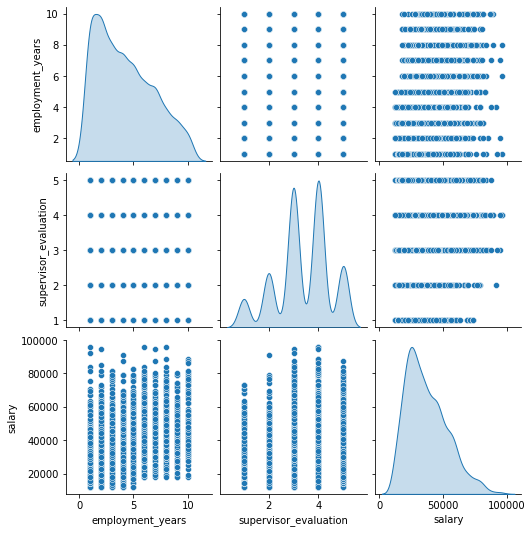

In [120]:
#Получаем кор.график по прзнакам
sns.pairplot(data=df_train_quit, kind='scatter',diag_kind='kde');

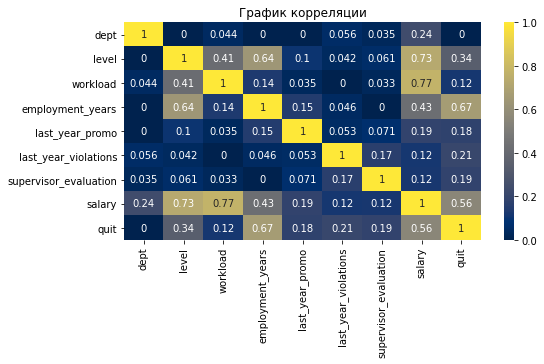

In [121]:
#Получаем кор.график по прзнакам
plt.figure(figsize=(8,4))
sns.heatmap(df_train_quit.phik_matrix(interval_cols=['salary']), annot=True, cmap='cividis')
plt.title('График корреляции');

Тут так же есть мультиколлинеарность между признаками.

In [122]:
#Групируем по целевому признаку и по среднему всех признаков
df_train_quit.groupby('quit').mean()

,employment_years,supervisor_evaluation,salary
quit,,,
no,4.908903,3.506729,40952.173913
yes,2.161832,2.958779,25767.938931


Сгрупировала данные по целевому признаку и среднему всех признаков. Получается, что в средняя зарплата ув. сотрудника составляет 37702р., с оценкой от руководителя 3.6, со стажом работы 4 года. Но стаж работы может быть и не верный. По скольку есть выбросы.

In [123]:
df_train_quit.groupby('dept')['quit'].value_counts(normalize=True)

dept        quit
hr          no      0.764368
            yes     0.235632
marketing   no      0.735225
            yes     0.264775
purchasing  no      0.720930
            yes     0.279070
sales       no      0.762733
            yes     0.237267
technology  no      0.741824
            yes     0.258176
Name: quit, dtype: float64

Самое большое количество уволевших сотрудников в отделе закупок.

In [124]:
df_train_quit.groupby('level')['quit'].value_counts(normalize=True)

level   quit
junior  yes     0.560543
        no      0.439457
middle  no      0.921217
        yes     0.078783
senior  no      0.951009
        yes     0.048991
Name: quit, dtype: float64

Самое большое количество уволевших сотрудников  уровнем junior.

In [125]:
df_train_quit.groupby('workload')['quit'].value_counts(normalize=True)

workload  quit
high      no      0.817420
          yes     0.182580
low       no      0.609920
          yes     0.390080
medium    no      0.795016
          yes     0.204984
Name: quit, dtype: float64

Как не странно больше всего увольнаются сотрудники с низким уровнем загруженности.

In [126]:
df_train_quit.groupby('last_year_promo')['quit'].value_counts(normalize=True)

last_year_promo  quit
no               no      0.735864
                 yes     0.264136
yes              no      0.990991
                 yes     0.009009
Name: quit, dtype: float64

Больше всего увольнаются сотрудники без повышении

In [127]:
df_train_quit.groupby('last_year_violations')['quit'].value_counts(normalize=True)

last_year_violations  quit
no                    no      0.774988
                      yes     0.225012
yes                   no      0.621849
                      yes     0.378151
Name: quit, dtype: float64

Такая же ситуайия с нарушениями.

Больше всего уволнялись из отдела продаж с загруженностью low и со средней зарплатой 15612р.

<div class="alert alert-success">
    
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Проанализирован портрет уволившегося сотрудника.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку❌:</b>
    
1. Анализ должен быть либо выполнен по всем признакам, либо должно быть хорошее обоснование, почему именно этот набор признаков лучше всего описывает портрет клиента. Сейчас часть признаков задана индексом сводной таблицы и не участвует в анализе.
    
2. Анализ нужно сделать с помощью относительных величин - оперировать абсолютными величинами не всегда удобно, так как в зависимости от масштаба исследования (компания на 100 человек и компания на 100 000 человек, например) результаты могут быть более или менее интерпретируемыми. Для категориальных/дискретных признаков мы можем использовать `value_counts(normalize=True)`, для непрерывных также стоит посчитать и сравнить средние.

<div class="alert alert-success">
    
<h2> Комментарий ревьюера v.2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Учтено.

In [128]:
#Соединяем целевые признаки в одну колонку
df_all_test_targ = df_test_target.join(df_test_target_quit,on='id')

In [129]:
df_all_test_targ.sample(10)

,job_satisfaction_rate,quit
id,,
903606,0.70,yes
796517,0.65,no
169164,0.85,no
270564,0.07,yes
336423,0.92,no
121688,0.32,no
790182,0.78,no
857722,0.39,no
965276,0.67,no


In [130]:
#Получаем графики по данным для сровнения целевых признаков
fig = px.histogram(df_all_test_targ, x="job_satisfaction_rate",color = "quit",title='Сравнительный график целевых признаков', nbins=20)
fig.show(size=30)

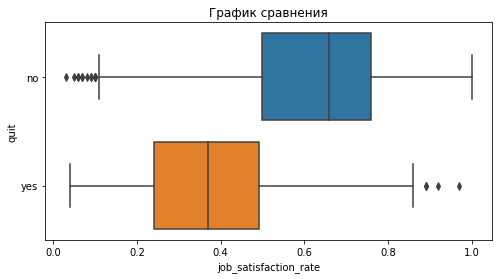

In [131]:
sns.boxplot(data=df_all_test_targ, x='job_satisfaction_rate', y='quit');
plt.title("График сравнения");

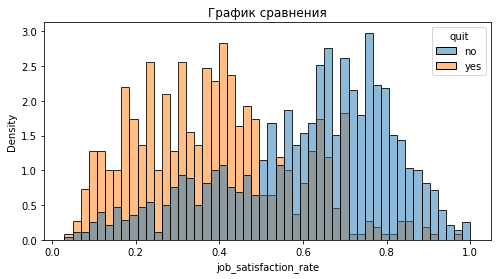

In [132]:
sns.histplot(data=df_all_test_targ, x='job_satisfaction_rate', hue='quit', bins=50, stat='density', common_norm=False);
plt.title('График сравнения');

Два целевых признака взаимосвязаны. Чем ниже оценка тем больше увольнение

<div class="alert alert-success">
    
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Исследовано распределение удовлетворённости в зависимости от факта ухода.

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Некоторые замечания и рекомендации⚠️:</b> Чуть более интересным решением, позволяющим выполнить оценку не "на глаз", а более статистически достоверно, было бы использование статистического теста (например, `ttest`) для сравнения распределений в выборках.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку❌:</b> Здесь мы имеем дело с непрерывной величиной - для анализа её распределения стоит использовать нормированную гистограмму (например, `shs.histplot()` с параметрами `stat='density', common_norm=False` или `sns.kdeplot()`): гистограммы такого типа позволяют нивелировать разницу в размерах выборок при анализе распределений. Обрати также внимание, что при использовании нормированных гистограмм по оси Y будет уже не частота значений, а плотность распределения.
</div>

<div class="alert alert-success">
    
<h2> Комментарий ревьюера v.2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Учтено.

In [133]:
df_test_target_all = df_test_features.join(df_test_target_quit,on='id')

### Добавление нового входного признака

In [134]:
prediction_train_q = pd.DataFrame(data=prediction_train)

In [135]:
X_train_t = df_train_quit.drop(['quit'],axis=1)
X_test_t = df_test_target_all.drop(['quit'],axis=1)
y_train_t = df_train_quit['quit']
y_test_t = df_test_target_all['quit']

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку❌:</b> `train` и `test` выборка даны как входные данные - сплитование не требуется.

<div class="alert alert-success">
    
<h2> Комментарий ревьюера v.2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Учтено.

In [136]:
X_train_t.shape, X_test_t.shape,y_train_t.shape,y_test_t.shape

((2587, 8), (2000, 8), (2587,), (2000,))

In [137]:
X_train_t = pd.merge(X_train_t, prediction_train_q,left_index=True, right_index=True)

In [138]:
X_train_t.sample(1)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,0
668,marketing,junior,medium,1,no,no,4,31200,0.625


In [139]:
X_train_t = X_train_t.rename(columns={0: 'job_satisfaction_rate_pred'})

In [140]:
X_train_t.sample(1)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate_pred
905,sales,middle,medium,3,no,no,4,44400,0.8075


<div class="alert alert-success">
    
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Добавили новый признак как предсказания предыдущей модели.

In [141]:
X_test_t['job_satisfaction_rate_pred'] = prediction

In [142]:
X_test_t.sample(1)

,dept,level,workload,employment_years,last_year_promo,last_year_violations,supervisor_evaluation,salary,job_satisfaction_rate_pred
id,,,,,,,,,
364247,sales,junior,medium,1,no,no,3,21600,0.18625


In [143]:
X_train_t.shape, X_test_t.shape,y_train_t.shape,y_test_t.shape

((2587, 9), (2000, 9), (2587,), (2000,))

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку❌:</b> Для `test` нужно получить собственные предсказания, а не использовать предсказания из `train`.

<div class="alert alert-success">
    
<h2> Комментарий ревьюера v.2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Учтено.

### Подготовка данных.Пайплайн

In [144]:
# создаём списки с названиями признаков
ohe_columns = ['last_year_promo','last_year_violations','dept']
ord_columns = ['level',
               'workload']
num_columns = ['employment_years','supervisor_evaluation','salary','job_satisfaction_rate_pred'] #,'supervisor_evaluation'

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку❌:</b> В `num_columns` не передан новый признак.

<div class="alert alert-success">
    
<h2> Комментарий ревьюера v.2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Учтено.

In [145]:
# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe_q = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))])
# создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe_q = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=np.nan))
     ,('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))])
ohe_pipe_q,ord_pipe_q

(Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')),
                 ('ohe',
                  OneHotEncoder(drop='first', handle_unknown='ignore',
                                sparse_output=False))]),
 Pipeline(steps=[('simpleImputer_before_ord',
                  SimpleImputer(strategy='most_frequent')),
                 ('ord',
                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                 unknown_value=nan)),
                 ('simpleImputer_after_ord',
                  SimpleImputer(strategy='most_frequent'))]))

In [146]:
# создаём общий пайплайн для подготовки данных
data_preprocessor_q = ColumnTransformer(
    [('ohe', ohe_pipe_q, ohe_columns),
     ('ord', ord_pipe_q,ord_columns),
     ('num', MinMaxScaler(), num_columns)],
    remainder='passthrough')

# создаём итоговый пайплайн: подготовка данных и модель
pipe_final_q = Pipeline([('preprocessor', data_preprocessor_q)
                       ,('models',  DecisionTreeClassifier(random_state=RANDOM_STATE))])

# словарь для моделей
param_grid_q = [{'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)]
               ,'models__max_depth': (None, *range(2, 6))
               ,'models__max_features': range(8,12)
               ,'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
                
                {'models': [RandomForestClassifier(random_state=RANDOM_STATE)],
               'models__n_estimators': range(50,100, 150),
               'models__max_features': ['sqrt', 'log2', None],
               'models__max_leaf_nodes': range(10, 15, 20),
               'models__max_depth': (None, *range(2, 6)),
               'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
                
                {'models': [RandomForestClassifier(random_state=RANDOM_STATE)],
               'models__n_estimators': range(100,120,140),
               'models__max_features': ['sqrt', 'log2'],
               'models__max_leaf_nodes': range(10,18),
               'models__max_depth': (None, *range(2, 6)),
               'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},


              {'models': [KNeighborsClassifier()]
               ,'models__n_neighbors': range(2,5)
               ,'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},

              {'models': [LogisticRegression(random_state=RANDOM_STATE,penalty='l1',solver='liblinear')]
               ,'models__C': range(1,5),
               'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']}]

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку❌:</b> `RandomForestRegressor` - модель регрессии, для этой задачи она не подходит.

<div class="alert alert-success">
    
<h2> Комментарий ревьюера v.2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Учтено.

In [147]:
param_grid_q

[{'models': [DecisionTreeClassifier(random_state=42)],
  'models__max_depth': (None, 2, 3, 4, 5),
  'models__max_features': range(8, 12),
  'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
 {'models': [RandomForestClassifier(random_state=42)],
  'models__n_estimators': range(50, 100, 150),
  'models__max_features': ['sqrt', 'log2', None],
  'models__max_leaf_nodes': range(10, 15, 20),
  'models__max_depth': (None, 2, 3, 4, 5),
  'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
 {'models': [RandomForestClassifier(random_state=42)],
  'models__n_estimators': range(100, 120, 140),
  'models__max_features': ['sqrt', 'log2'],
  'models__max_leaf_nodes': range(10, 18),
  'models__max_depth': (None, 2, 3, 4, 5),
  'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
 {'models': [KNeighborsClassifier()],
  'models__n_neighbors': range(2, 5),
  'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']},
 {'models':

In [148]:
pipe_final_q.fit(X_train_t, y_train_t)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['last_year_promo',
                                                   'last_year_violations',
                                                   'dept']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_befor...
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ord',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan)),
                                                                  ('simpleImputer_after_ord',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['level', 'workload']),
                                                 ('num', MinMaxScaler(),
                                                  ['employment_years',
                                                   'supervisor_evaluation',
                                                   'salary',
                                                   'job_satisfaction_rate_pred'])])),
                ('models', DecisionTreeClassifier(random_state=42))])

In [149]:
%%time
#Испльзуем RandomizedSearchCV для поиска лучших параметров
randomized_search_quit = RandomizedSearchCV(pipe_final_q, param_grid_q, cv=5,scoring='roc_auc'
                                       ,random_state=RANDOM_STATE,n_jobs=-1,error_score='raise')
randomized_search_quit

CPU times: user 24 µs, sys: 3 µs, total: 27 µs
Wall time: 31 µs


RandomizedSearchCV(cv=5, error_score='raise',
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ohe',
                                                                               Pipeline(steps=[('simpleImputer_ohe',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('ohe',
                                                                                                OneHotEncoder(drop='first',
                                                                                                              handle_unknown='ignore',
                                                                                                              sparse_output=False))]),
                                                                               ['last_year_promo',
                                                                                'last_year_violations'...
                                                               'passthrough']},
                                        {'models': [KNeighborsClassifier()],
                                         'models__n_neighbors': range(2, 5),
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               'passthrough']},
                                        {'models': [LogisticRegression(penalty='l1',
                                                                       random_state=42,
                                                                       solver='liblinear')],
                                         'models__C': range(1, 5),
                                         'preprocessor__num': [StandardScaler(),
                                                               MinMaxScaler(),
                                                               'passthrough']}],
                   random_state=42, scoring='roc_auc')

In [150]:
%%time
#Обучаем моднель по полученным данным


randomized_search_quit.fit(X_train_t, y_train_t)

print('Лучшая модель и её параметры:\n\n', randomized_search_quit.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', randomized_search_quit.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['last_year_promo',
                                                   'last_year_violations',
                                                   'dept']),
                                  

<div class="alert alert-success">
    
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Лучшая модель найдена.

<div class="alert alert-info">
<h2> Комментарий студента <a class="tocSkip"> </h2>

После удаление дубликатов и добавление нового признака лучшая модель изменилась. Пробавала поменять гиперпараметры. И максимум что я могла получить это 0.90.
</div>

In [151]:
# В best_model будет храниться наш пайплайн
best_model_q = randomized_search_quit.best_estimator_
rf_model_quit = best_model_q.named_steps['models']
rf_model_quit

RandomForestClassifier(max_features='log2', max_leaf_nodes=17, random_state=42)

In [152]:
#Кодируем признаки с помощю пайплайна
X_train_t = best_model_q.named_steps['preprocessor'].fit_transform(X_train_t)
X_test_t = best_model_q.named_steps['preprocessor'].transform(X_test_t)

/opt/conda/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:241: UserWarning:

Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros



In [153]:
#Обучение
model_quit = rf_model_quit.fit(X_train_t,y_train_t)
model_quit

RandomForestClassifier(max_features='log2', max_leaf_nodes=17, random_state=42)

In [154]:
y_pred_quit = model_quit.predict_proba(X_test_t)[:,1]

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку❌:</b>

Давай вспомним, что из себя представляет метрика `AUC-ROC` и подходит ли метод `predict` для её оценки?

<div class="alert alert-info">
<h2> Комментарий студента <a class="tocSkip"> </h2>

Как только я не пробовала. Больше этого я не могу получить метрику.Есть подозрения, что это из за неудалённых дубликатов в тесте.
</div>

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v.2 <a class="tocSkip"></h2>

    
<b>На доработку❌:</b>

Повышение качества предыдущей модели за счёт лучшей оптимизации гиперпараметров, а также учёт замечаний по гиперпараметрам для этой задачи должны исправить положение. Также можно добавить `RandomForestClassifier` по аналогии с первой задачей.

<div class="alert alert-success">
<h2> Комментарий ревьюера v.3 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b>
    
Учтено.

In [155]:
roc_auc = roc_auc_score(y_test_t,y_pred_quit)
round(roc_auc,2)

0.92

In [156]:
dummy_clf = DummyClassifier(strategy="most_frequent")

In [157]:
dummy_clf.fit(X_train_t,y_train_t)

DummyClassifier(strategy='most_frequent')

In [158]:
dummy_pred_quit = dummy_clf.predict_proba(X_test_t)[:,1]

In [159]:
dummy =  dummy_clf.score(X_test_t, y_test_t)

In [160]:
dummy_roc_auc = roc_auc_score(y_test_t,dummy_pred_quit)
round(dummy_roc_auc,2)

0.5

Самая лучшая модель на тренировочной выборке это RandomForestClassifier с метрикой roc-auc 0.92. DummyClassifier получается 0.5.

### Вывод

На тестовых данных, с новым признаком уровень удовлетворённости сотрудника 0.92 .

<div class="alert alert-success">
    
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Требуемое качество достигнуто.

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Некоторые замечания и рекомендации⚠️:</b> Аналогично стоит выполнить оценку модели на адеватность - в случае задачи классификации мы можем использовать  `DummyClassifier` (https://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyClassifier.html#sklearn.dummy.DummyClassifier).
        

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v.2 <a class="tocSkip"></h2>

    
<b>На доработку❌:</b>

Аналогично нужно поправить оценку константной модели.

<div class="alert alert-success">
<h2> Комментарий ревьюера v.3 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b>
    
Учтено.
    

# Общий вывод

Задача №1
Были пропуски в двух выборках - в тренировочной выборке и в входных признаках тестовой выборки. В столбцах отдел сотрудника и уровень занимаемой должности.
Были дубликаты и в трен., и в тест. признаках. Удалила дупликаты из тренировочной выборки.

Данные типа float,int,obj

Иследовотельского анализ.

В графике уровень уд. два пика 0.33-0.37 и 0.63-0.67.Выбросов нету.

По годам большинство сотрудников работают от 1 до 2 года.В основном у большинства з/п от 25 до 30к. У большинства оценка качества работы 3 и 4.

Большинство сотрудников работают в отделе продаж.Но удовлетворенны в основном в отделе закупок.Уровень должности в основном junior и middle,но удовлетворенны в основном в должности middle. Загруженность в основном средняя,но удовлетворенны в основном со средней и высокой загруженностю. Повышение за последний год было только один раз, удовлетворенны в основном сотрудники с повышением. Нарушенний тоже было но немного,удовлетворенны в основном сотрудники без нарушении.Были выбросы в признаках зарплата и оценка со стороны руководителя

На тестовой выборке большинство сотрудников работают от 1 до 2 лет,в отделе продаж,уровнем должности junior,уровнем загруженности medium,без повышении,без нарушении,ежемесячная зарплата 25-29.9к,с оценкой 4.Выбросы есть в признаках зарплата и оценка качества работы.

Корреляционный анализ

По распределению на тренировочной выборке есть умеренная зависимость между ежемесячная зарплатой, уровень удовлетворённости сотрудника и длительность работы в компании. Заметная зависимость между признаками нарушения сотрудника и уровень удовлетворённости сотрудника. Высокая зависимость между признаками ежемесячная зарплата и уровень занимаемой должности,уровень загруженности сотрудника и между признаками уровень удовлетворённости сотрудника и оценка качества работы сотрудника.

На тестовой выборке есть заметная зависимость между признаками длительность работы в компании и уровень занимаемой должности,ежемесячная зарплата сотрудника.Высокая зависимость между признаками ежемесячная зарплата сотрудника уровень занимаемой должности,уровень загруженности сотрудника.

Обучение на тренировочной выборке


Лучшая модель стала DecisionTreeRegressor, метрика sMAPE показывает 14.1%. На тренировочных данных получается 15.5%

Тестовые данные.

Симметричная средняя абсолютная процентная ошибка (SMAPE), если посчитать по диапазону от 0-200 то получаем процентную ошибку 14.1%. Лучшей моделю оказалась DecisionTreeRegressor. Такой результат получила после того, как поменяла параметр max_depth и удалила пропуск в виде пробела в признаке 'depth' До этого на тестовых данных sMAPE был 15.3%.DummyRegressor получила 38.3%.

Задача-2

Пропусков не было.Дубликаты были.

Удалила дубликаты трен. выборки.

В трен. выборке большинство сотрудников работают от 1-2 лет, зарплатой 30-34.9к,оценкой 3-4.По гистограмме видно, что самое большое количество уволненных сатрудников работали год,зарплата от 20 до 24.5к,с оценкой 3.Выбросы есть в признаке зарплата и оценка.

На тренировочной выборке по гистограмме видно, что самое большое количество уволненных сатрудников работали год,зарплата от 20 до 24.5к,с оценкой 3.Выбросы есть в признаке зарплата и оценка.Так же есть мультиколлинеарность между признаками тренировочнйы вборки.Самое большое количество уволевших сотрудников в отделе закупок.Самое большое количество уволевших сотрудников уровнем junior.Как не странно больше всего увольнаются сотрудники с низким уровнем загруженности.Больше всего увольнаются сотрудники без повышении.Такая же ситуайия с нарушениями.Сравнивая по гистограмме и boxplot-ом целевые признаки двух задач, видно, что они взаимосвязаны.Чем ниже оценка тем больше увольнени

В входные признаки(тренировочных и тестовых)  добавила признак предсказанную оценку удовлетворённости сотрудника.

Во время обучения тренировочной выборки получила лучшую модель RandomForestClassifier с оценко метрики roc-auc 0.91. Метрика на тестовых данныхика показывает результат 0.92. DummyClassifier получается 0.5.

Можно сделать вывод, что сотрудники из отдела закупок более скллонны к увольнению. Можно сделать отдельный опрос по этому отделу. Узнать в чём является причина низкой оценки со стороны сотрудника. Скорее всего связь будет между зарплатой,загруженностю,уровнем должности. Может сотрудники отдела перезагружены и не успевают с задачами и из за этого и падает оценка со стороны руководителя, и в конце концов это ведёт к уволнению. Можно добавить персонал в этом отделе, что бы загруженность упала.

<div class="alert alert-success">
    
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> Есть итоговый вывод и рекомендации - отлично!

<div style="border:solid Chocolate 2px; padding: 40px">

# Комментарий ревьюера: общий вывод по проекту.

Лусине, проект получился на довольно хорошем уровне - отличная работа над проектом, молодец!

Мне нравится твой аналитический подход к выполнению проекта, ты соблюдаешь структуру работы, выполняешь её последовательно - это очень хорошо! Шаги проекта выполнены по порядку согласно плану проекта, нет смысловых и структурных ям. Важно, что не забываешь про выводы.

Работа с моделями также выполнена отлично: исследовано несколько алгоритмов, проведён подбор гиперпараметров с помощью `RandomizedSearchCV`, выполнена промежуточная оценка моделей на кросс-валидации - молодец! Здорово, что используешь сочетание `ColumnTransformer` и `Pipeline` для соединения разных инструментов в единый модельный объект и настраиваешь бесперебойную работу энкодера в случае появления в данных новых, неизвестных на момент обучения значений признаков - так твоё решение будет более гибким и масштабируемым.
    
Над проектом ещё стоит поработать - есть рекомендации по дополнению некоторых твоих шагов проекта. Такие рекомендации я отметил жёлтыми комментариями. Будет здорово, если ты учтёшь их - так проект станет структурно и содержательно более совершенным.
    
Также в работе есть критические замечания. К этим замечаниям я оставил пояснительные комментарии красного цвета, в которых перечислил возможные варианты дальнейших действий. Уверен, ты быстро с этим управишься:)
    
Если о том, что нужно сделать в рамках комментариев, будут возникать вопросы - оставь их, пожалуйста, в комментариях, и я отвечу на них во время следующего ревью.
    
Также буду рад ответить на любые твои вопросы по проекту или на какие-либо другие, если они у тебя имеются - оставь их в комментариях, и я постараюсь ответить:)
    
Жду твой проект на повторном ревью. До встречи:)

<div style="border:solid Chocolate 2px; padding: 40px">

# Комментарий ревьюера: финальный вывод по проекту.

Лусине, все замечания учтены - проект принят!
    
Спасибо за хорошую работу над проектом, желаю успехов в дальнейшем обучении:)